In [1]:
import geopandas as gpd
import pandas as pd
import utilities as util
import numpy as np
import folium
import datetime
import preprocessor as prep



<h1> Sperm Whale - Physeter macrocephalus


![Alt text](../data/Images/Mother_and_baby_sperm_whale.jpg)

License for image: https://creativecommons.org/licenses/by-sa/2.0/legalcode
Taken from: Wikipedia - https://commons.wikimedia.org/wiki/File:Mother_and_baby_sperm_whale.jpg

<h1> Aknowledgments</h1>
Study Name	Sperm whales Gulf of Mexico 2011-2013 - Fastloc GPS data
Contact Person	tomasf (Tomas)
Principal Investigator	dpalacios (Daniel Palacios)
Citation	Irvine LM, Follett TM, Winsor MH, Mate BR, Palacios DM. 2020. Data from: Study "Sperm whales Gulf of Mexico 2011-2013 - Argos data". Movebank Data Repository. doi: 10.5441/001/1.tj291471

Irvine LM, Winsor MH, Follett TM, Mate BR, Palacios DM. 2020. An at-sea assessment of Argos location accuracy for three species of large whales, and the effect of deep-diving behavior on location error. Animal Biotelemetry. 8:20. doi: 10.1186/s40317-020-00207-x


https://www.movebank.org/cms/webapp?gwt_fragment=page=studies,path=study15661938


<h2>Study Statistics</h2>
<list>
<br>Number of Animals:	17
<br>Number of Tags	18
<br>Number of Deployments	18
<br>Time of First Deployed Location	2011-07-10 23:16:00.000
<br>Time of Last Deployed Location	2013-09-18 17:37:19.000<br>
_______________________________________________________________________________________________________________
<br><br><br>

In [2]:
full_hurricane_1992 = prep.process_hurricane_txt('C:/Users/Ben/Documents/GitHub/Animal-Motion-for-predictions/data/hurricanes_1992.txt')
sperm_whales = prep.sperm_whale_preprocess('C:/Users/Ben/Documents/GitHub/Animal-Motion-for-predictions/data/whaleSharks/Sperm whales Gulf of Mexico 2011-2013 - Fastloc GPS data.csv')

c:\Users\Ben\Documents\GitHub\Animal-Motion-for-predictions\src\preprocessor.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lat_column.iloc[i] = lat
c:\Users\Ben\Documents\GitHub\Animal-Motion-for-predictions\src\preprocessor.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lon_column.iloc[i] = lon


In [8]:
p = util.get_cross_points(full_hurricane_1992, sperm_whales,450)
p

c:\Users\Ben\Documents\GitHub\Animal-Motion-for-predictions\src\utilities.py:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  good_pnts = good_pnts.append(row, ignore_index= True)
c:\Users\Ben\Documents\GitHub\Animal-Motion-for-predictions\src\utilities.py:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  good_pnts = good_pnts.append(row, ignore_index= True)
c:\Users\Ben\Documents\GitHub\Animal-Motion-for-predictions\src\utilities.py:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  good_pnts = good_pnts.append(row, ignore_index= True)
c:\Users\Ben\Documents\GitHub\Animal-Motion-for-predictions\src\utilities.py:165: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version.

,latitude,longitude,date,name,event_name,day_dif_from_event,distance_from_event_in_km
0,27.8142,-89.5294,2011-08-23 00:38:00,"""2011GoM-Pma-00823""",LEE2,9 days 23:22:00,229.011081
1,27.8207,-89.5412,2011-08-23 00:44:00,"""2011GoM-Pma-00823""",LEE2,9 days 23:16:00,228.493849
2,27.8132,-89.5196,2011-08-23 01:30:00,"""2011GoM-Pma-00823""",LEE2,9 days 22:30:00,229.729924
3,27.8161,-89.5217,2011-08-23 01:35:00,"""2011GoM-Pma-00823""",LEE2,9 days 22:25:00,229.749535
4,27.8215,-89.5061,2011-08-23 02:20:00,"""2011GoM-Pma-00823""",LEE2,9 days 21:40:00,231.346727
...,...,...,...,...,...,...,...
77,27.5086,-89.8947,2011-08-27 17:21:02,"""2011GoM-Pma-00823""",LEE2,5 days 06:38:58,180.075043
78,27.5155,-89.9337,2011-08-27 18:24:00,"""2011GoM-Pma-00823""",LEE2,5 days 05:36:00,177.327124
79,27.3708,-89.9539,2011-08-27 22:41:00,"""2011GoM-Pma-00823""",LEE2,5 days 01:19:00,166.966259
80,27.3615,-89.9708,2011-08-27 23:09:00,"""2011GoM-Pma-00823""",LEE2,5 days 00:51:00,165.003405


In [4]:
p['name'].unique()

array(['"2011GoM-Pma-00823"'], dtype=object)

In [15]:
grr = p.groupby('event_name')
Crossed_points = {}
for event_na in p['event_name'].unique():
    event_data = full_hurricane_1992.loc[full_hurricane_1992['name']== event_na]
    curernt_event_group = grr.get_group(event_na)
    event_start_date = event_data['date'].min()
    event_end_date = event_data['date'].max()
    
    Crossed_points[event_na] = {
                                'event name': event_na,
                                'start date': event_start_date,
                                'end date': event_end_date,
                                'event data': event_data,
                                'animals':  {}
                                }
        
    for animal_na in curernt_event_group['name'].unique():
        print(animal_na)
        animal_data = sperm_whales[sperm_whales['name']==animal_na]
        animal_data = animal_data.sort_values('date')
        animal_before = animal_data.loc[(animal_data['date'] < event_start_date) & (animal_data['date'] >= event_start_date - pd.Timedelta(days=7))]
        animal_during = animal_data.loc[(animal_data['date'] >= event_start_date) & (animal_data['date'] <= event_end_date)]
        animal_after = animal_data.loc[(animal_data['date'] > event_end_date) & (animal_data['date']< event_end_date + pd.Timedelta(days=4))]
        animal_dict = {
                        'animal name': animal_na,
                        'animal data': animal_data,
                        'before event': animal_before,
                        'during event': animal_during,
                        'after event': animal_after,
                    }


"2011GoM-Pma-00823"


In [9]:
print(Crossed_points['LEE2']['animals']['"2011GoM-Pma-00823"']['after event'].shape,'\n')


NameError: name 'Crossed_points' is not defined

In [3]:
# p['distance_from_event_in_km'].min()
# p['event_name'].unique()

# ind_05640 = sperm_whales[sperm_whales['name']=='"2011GoM-Pma-05640"']
ind_00823 = sperm_whales[sperm_whales['name']=='"2011GoM-Pma-00823"']
# ind_05701 = sperm_whales[sperm_whales['name']=='"2013GoM-Pma-05701"']
grouped_h = full_hurricane_1992.groupby(full_hurricane_1992['name'])
LEE2 = grouped_h.get_group('LEE2')


start_date_LEE2 = full_hurricane_1992[full_hurricane_1992['name']== 'LEE2']['date'].min()
end_date_LEE2 = full_hurricane_1992[full_hurricane_1992['name']== 'LEE2']['date'].max()
# DON = grouped_h.get_group('DON')



In [6]:
from datetime import timedelta
ind_00823_before_LEE2 = ind_00823.loc[(ind_00823['date'] < start_date_LEE2) & (ind_00823['date'] > start_date_LEE2 - timedelta(days=10))]
ind_00823_during_LEE2 = ind_00823.loc[(ind_00823['date'] >= start_date_LEE2) & (ind_00823['date'] <= end_date_LEE2)]
ind_00823_after_LEE2 = ind_00823.loc[(ind_00823['date'] > end_date_LEE2)]

avg depth before event:  -40.762558  avg depth during event:  nan  avg depth after event:  nan



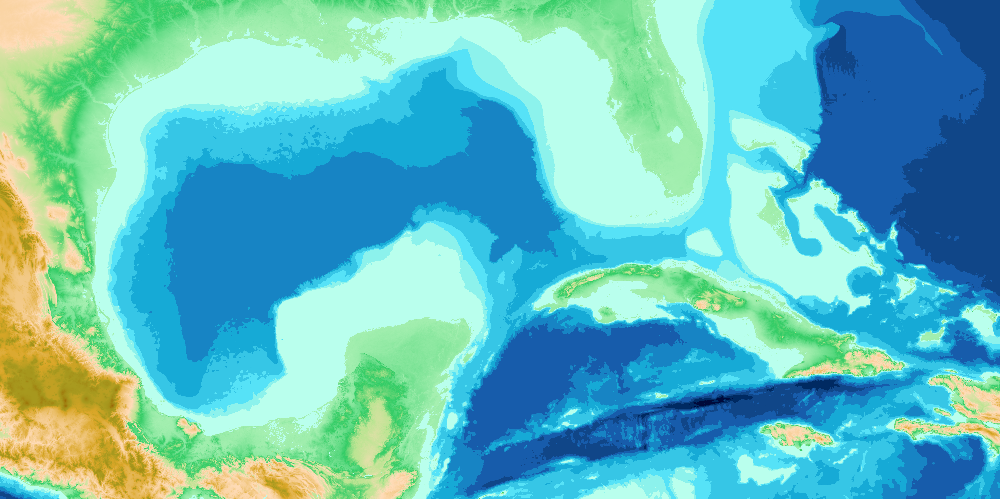

In [7]:
map = folium.Map(location = [ind_00823['latitude'].mean(),ind_00823['longitude'].mean()],zoom_start=4)
util.mark_layered_map(map,'Hurricane LEE2',LEE2,'tornado','pink')
util.mark_before_during_after(map,ind_00823['name'].iloc[0],ind_00823_before_LEE2,ind_00823_during_LEE2,ind_00823_after_LEE2)
print('avg depth before event: ', ind_00823_before_LEE2['depth'].mean(),' avg depth during event: ', ind_00823_during_LEE2['depth'].mean(), ' avg depth after event: ', ind_00823_after_LEE2['depth'].mean() )
map

In [41]:
print('min ',ind_00823['date'].min(),' max ',ind_00823['date'].max(),ind_00823['date'].max()- ind_00823['date'].min())
print('min ',LEE['date'].min(),' max ', LEE['date'].max(),LEE['date'].max()- LEE['date'].min())
start_date = LEE['date'].min() - pd.DateOffset(days=13)
end_date = LEE['date'].max() + pd.DateOffset(days=5)
ind_00823_LEE = ind_00823.loc[(ind_00823['date'] >= start_date)]
# ind_00823_LEE

min  2011-07-17 19:17:34  max  2011-08-27 23:37:04 41 days 04:19:30
min  2011-09-02 00:00:00  max  2011-09-06 00:00:00 4 days 00:00:00


In [42]:
ind_00823_LEE['date'].unique()

array(['2011-08-20T00:31:00.000000000', '2011-08-20T01:37:03.000000000',
       '2011-08-20T01:43:00.000000000', '2011-08-20T03:54:00.000000000',
       '2011-08-20T04:41:00.000000000', '2011-08-21T03:42:00.000000000',
       '2011-08-21T05:26:00.000000000', '2011-08-21T10:04:00.000000000',
       '2011-08-21T13:49:00.000000000', '2011-08-21T14:12:00.000000000',
       '2011-08-21T14:26:08.000000000', '2011-08-21T14:31:00.000000000',
       '2011-08-21T15:21:24.000000000', '2011-08-21T15:39:37.000000000',
       '2011-08-21T16:18:00.000000000', '2011-08-21T16:51:00.000000000',
       '2011-08-21T17:07:28.000000000', '2011-08-21T17:13:00.000000000',
       '2011-08-21T17:47:01.000000000', '2011-08-21T19:13:00.000000000',
       '2011-08-21T19:40:00.000000000', '2011-08-21T22:22:00.000000000',
       '2011-08-21T22:58:00.000000000', '2011-08-22T00:39:12.000000000',
       '2011-08-22T01:48:00.000000000', '2011-08-22T02:38:00.000000000',
       '2011-08-22T03:32:00.000000000', '2011-08-23

In [43]:
map = folium.Map(location=[20, -20], zoom_start=2)
# # map = util.mark_map(map,KAREN,'tornado','purple')
map = util.mark_map(map,LEE,'tornado','red')
# # map = util.mark_map(map,DON,'tornado','black')
# map = util.mark_map(map,ind_00823_LEE,'fish','blue')

line = folium.PolyLine(locations=list(zip(ind_00823_LEE['latitude'],ind_00823_LEE['longitude'])), color='red')

# add the PolyLine object to the map
line.add_to(map)

# display the map
# map = util.mark_map(map,ind_05640,'fish','green')
# map = util.mark_map(map,ind_05701,'fish','purple')
map

Index(['date', 'Hour UTC', 'latitude', 'longitude', 'max_wind', 'min_pressure',
       'name'],
      dtype='object')


In [8]:
# full_hurricane['year']= full_hurricane['date'].dt.year
# grouped_by_year = full_hurricane.groupby(full_hurricane['year'])
# h_2011 = grouped_by_year.get_group(2011)
# h_2011
# map = folium.Map(location=[20,-90],zoom_start=4)
# map = util.mark_map(map,h_2011)
# map

In [4]:
grouped_by_name = sperm_whales.groupby(sperm_whales['name'])
i=0
for name, group in grouped_by_name:
    start_date = group['date'].min()
    end_date= group['date'].max()
    print(name, ' ', group.shape,start_date," ", end_date)

"2003GoM-Pma-00843"   (1525, 6) 2013-07-10 19:06:06   2013-08-21 19:22:23
"2010GoM-Pma-00849"   (48, 6) 2011-07-23 20:46:58   2011-08-02 01:00:00
"2010GoM-Pma-05800"   (243, 6) 2013-08-03 03:08:00   2013-08-26 20:44:00
"2011GoM-Pma-00823"   (920, 6) 2011-07-17 19:17:34   2011-08-27 23:37:04
"2011GoM-Pma-00832"   (102, 6) 2011-07-11 15:56:42   2011-08-15 03:20:00
"2011GoM-Pma-00838"   (100, 6) 2011-07-18 00:25:00   2011-08-07 10:41:05
"2011GoM-Pma-00845"   (138, 6) 2011-07-20 19:35:33   2011-08-15 02:13:00
"2011GoM-Pma-05640"   (29, 6) 2011-07-11 19:16:10   2011-07-29 11:16:01
"2011GoM-Pma-05654"   (128, 6) 2011-07-17 22:16:20   2011-08-21 02:22:29
"2011GoM-Pma-05655"   (124, 6) 2011-07-24 13:53:01   2011-08-17 02:18:00
"2011GoM-Pma-05826"   (13, 6) 2011-07-10 23:16:00   2011-07-23 08:02:01
"2011GoM-Pma-05910"   (147, 6) 2011-07-24 07:02:38   2011-08-22 08:05:37
"2011GoM-Pma-05921"   (127, 6) 2011-07-20 20:09:48   2011-08-17 20:58:03
"2013GoM-Pma-00840"   (1355, 6) 2013-07-14 20:14:00  